# Packages

In [1]:
# System
import warnings
warnings.filterwarnings("ignore")

# Data manipulation
import pandas as pd
pd.get_option("display.max_columns")
import numpy as np

# Visualizations
import matplotlib.pyplot as plt
import seaborn as sns

# Statistics
import statsmodels.api as sm
from statsmodels.stats.anova import AnovaRM
from pingouin import ttest
from scipy import stats
from scipy.stats import median_test
from sklearn.linear_model import LinearRegression

# Functions

In [2]:
# The following three functions make a correlation matrix with scatterplot in lower left, 
# pearson correlation coefficient bubble plot in upper right, and distribution
# plot down the diagonal
def corrdot(*args, **kwargs):
    corr_r = args[0].corr(args[1], 'pearson')
    corr_text = f"{corr_r:2.2f}".replace("0.", ".")
    ax = plt.gca()
    ax.set_axis_off()
    marker_size = 1
    ax.scatter([.5], [.5], marker_size, [corr_r], alpha=0.001, cmap="Greys", \
               vmin=-1, vmax=1, transform=ax.transAxes)
    font_size = 40
    ax.annotate(corr_text, [.5, .5,],  xycoords="axes fraction", ha='center', \
                va='center', fontsize=font_size)

def annotate_colname(x, **kws):
    ax = plt.gca()
    ax.annotate(x.name, xy=(0.05, 0.9), xycoords=ax.transAxes, fontweight='bold')
    
def corr_plot(df):
    sns.set(style='white', font_scale=1.6)
    g = sns.PairGrid(df, aspect=1.4, diag_sharey=False)
    g.map_lower(sns.regplot, scatter_kws={'s':10, 
                                          'color':'k'})
    g.map_diag(sns.distplot, kde_kws={'color': 'black'})
    g.map_diag(annotate_colname)
    g.map_upper(corrdot)
    plt.rcParams["figure.dpi"] = 300
    plt.show()

def theory_cat(df, col):
    cat = []
    for i in range(len(df)):
        if df[col][i]>2:
            categ = 'low'
        else:
            categ = 'high'
        cat.append(str(col+"_"+categ))
    return cat

# Read in the data

In [3]:
raw_data = pd.read_csv("../data/01_raw/raw_for_analysis.csv")
data = raw_data.copy()

In [4]:
data.sample(5)

,race,education,income,one_ten_prop_10,one_ten_q1,one_ten_q2,one_ten_q3,one_ten_q4,one_ten_q5,one_ten_q6,...,other_rank_1,other_rank_1_text,other_rank_2,other_rank_2_text,other_rank_3,other_rank_3_text,other_rank_4,other_rank_4_text,other_rank_5,other_rank_5_text
2,White or Caucasian,"Some college, but no degree","$50,000-$74,999",0.7,10,10,10,10,10,0.0,...,3,personal morals,10,environmental impacts,9,build up to the decision,8,number of people impacted,7,background of those involved
10,White or Caucasian,Bachelor's degree,"$100,000-$149,999",1.0,10,10,10,10,10,10.0,...,6,NaN,7,NaN,8,NaN,9,NaN,10,NaN
15,White or Caucasian,"Graduate or professional degree (MA, MS, MBA, ...","$75,000-$99,999",1.0,10,10,10,10,10,10.0,...,6,NaN,7,NaN,8,NaN,9,NaN,10,NaN
1,White or Caucasian,Bachelor's degree,"$25,000-$49,999",0.9,10,10,10,10,10,10.0,...,5,The reasonableness of the action,7,NaN,8,NaN,9,NaN,10,NaN
27,White or Caucasian,High school diploma or GED,"$50,000-$74,999",1.0,10,10,10,10,10,10.0,...,6,NaN,7,NaN,8,NaN,9,NaN,10,NaN


# Demographics information

In [5]:
for col in ['race', 'education', 'income']:
    temp_df = data[col].value_counts().reset_index()
    temp_df['percentage'] = (temp_df[col]/temp_df[col].sum())*100
    print(col, temp_df, "\n\n")

race                                               index  race  percentage
0                                White or Caucasian    25   83.333333
1                                             Asian     1    3.333333
2                          White or Caucasian,Other     1    3.333333
3         Native Hawaiian or Other Pacific Islander     1    3.333333
4                         Black or African American     1    3.333333
5  American Indian/Native American or Alaska Native     1    3.333333 


education                                                index  education  percentage
0                                  Bachelor's degree         14   46.666667
1                        Some college, but no degree          7   23.333333
2  Graduate or professional degree (MA, MS, MBA, ...          6   20.000000
3                         High school diploma or GED          3   10.000000 


income                index  income  percentage
0    $25,000-$49,999       7   23.333333
1    $75,000-$99,999

# Analytic Dataframe

In [6]:
# Subset the dataframe to only the cols with the primary DVs. 
df = data[[
    'race',
    'education',
    'income',
    'one_ten_prop_10',
    'five_one_prop_50',
    'one_five_prop_10',
    'ten_one_prop_100',
    'loss_money_h',
    'gain_money_h',
    'loss_ethics_h',
    'gain_ethics_h',
    'utilitarian_rank',
    'deontology_rank',
    'virtue_rank',
    'ethics_care_rank',
    'contract_theory_rank'
]]

# Check out a snippet of the resulting df
df.sample(5)

,race,education,income,one_ten_prop_10,five_one_prop_50,one_five_prop_10,ten_one_prop_100,loss_money_h,gain_money_h,loss_ethics_h,gain_ethics_h,utilitarian_rank,deontology_rank,virtue_rank,ethics_care_rank,contract_theory_rank
22,Native Hawaiian or Other Pacific Islander,High school diploma or GED,"Less than $25,000",0.7,0.3,0.8,0.3,1.06,0.82,0.01,2.93,4,5,1,2,3
1,White or Caucasian,Bachelor's degree,"$25,000-$49,999",0.9,0.1,0.9,0.1,0.94,1.22,1.06,0.82,1,3,2,6,4
11,White or Caucasian,"Graduate or professional degree (MA, MS, MBA, ...","$25,000-$49,999",0.1,0.8,0.1,0.9,0.55,2.13,0.01,1.82,4,3,2,6,5
7,White or Caucasian,"Graduate or professional degree (MA, MS, MBA, ...","$75,000-$99,999",0.9,0.1,1.0,0.3,4.29,2.13,1.22,3.45,4,1,2,5,3
27,White or Caucasian,High school diploma or GED,"$50,000-$74,999",1.0,0.0,1.0,0.0,3.45,9.65,3.45,0.18,3,1,2,5,4


# Visualizations

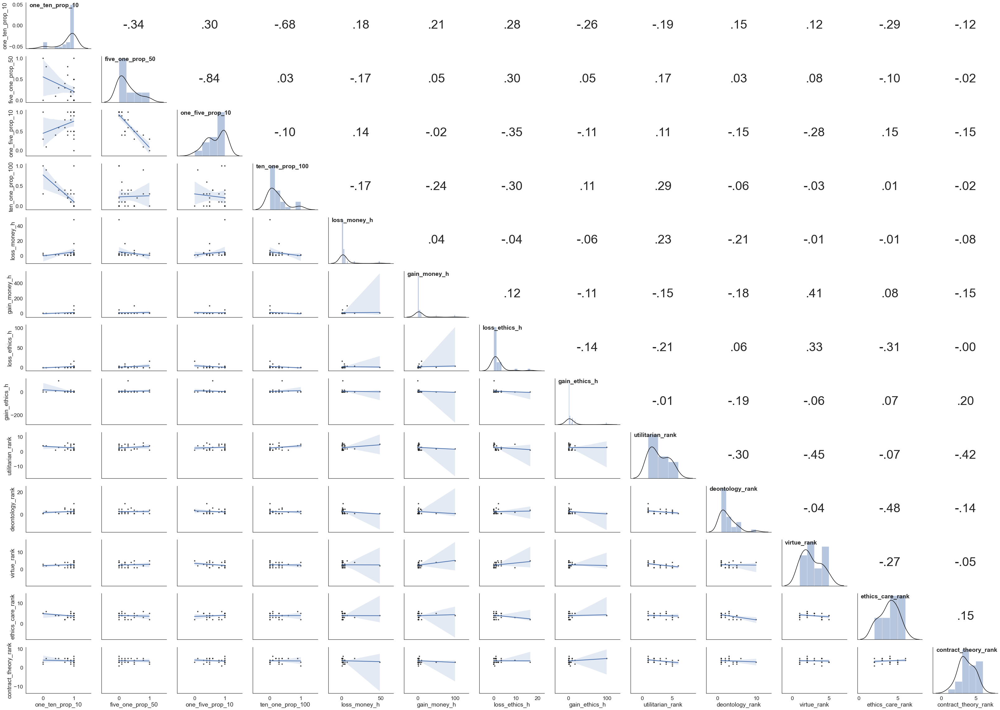

In [7]:
# Plot all of it
corr_plot(df)

### Probability Matching

In [8]:
prob_match_df = df[['one_ten_prop_10', 'one_five_prop_10', 'five_one_prop_50', 'ten_one_prop_100']]

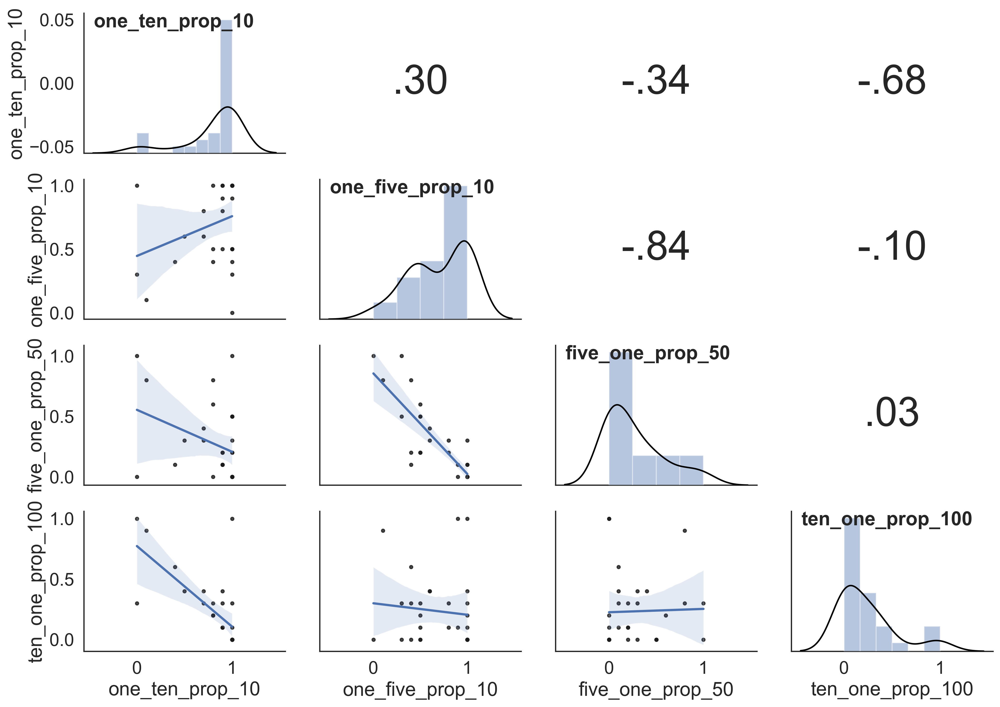

In [9]:
# Correlation matrix
corr_plot(prob_match_df)

#### # Proper probablity matching plot

In [10]:
# PREP FOR EASIER PLOTTING
prob_match_df_long = prob_match_df.copy().dropna().reset_index(drop=True)
prob_match_df_long['p_id'] = list(range(1, len(prob_match_df)+1))

# Turn from wide to long
prob_match_df_long = prob_match_df_long.melt(id_vars=['p_id'])

# Replace header vals with expected value of first option
prob_match_df_long = prob_match_df_long.replace(           
    {
        'one_ten_prop_10':.9, 
        'one_five_prop_10':.8,
        'five_one_prop_50':.2, 
        'ten_one_prop_100':.1
    }
)
prob_match_df_long[::17]

,p_id,variable,value
0,1,0.9,1.0
17,18,0.9,1.0
34,5,0.8,0.4
51,22,0.8,1.0
68,9,0.2,0.3
85,26,0.2,0.2
102,13,0.1,0.0
119,30,0.1,0.0


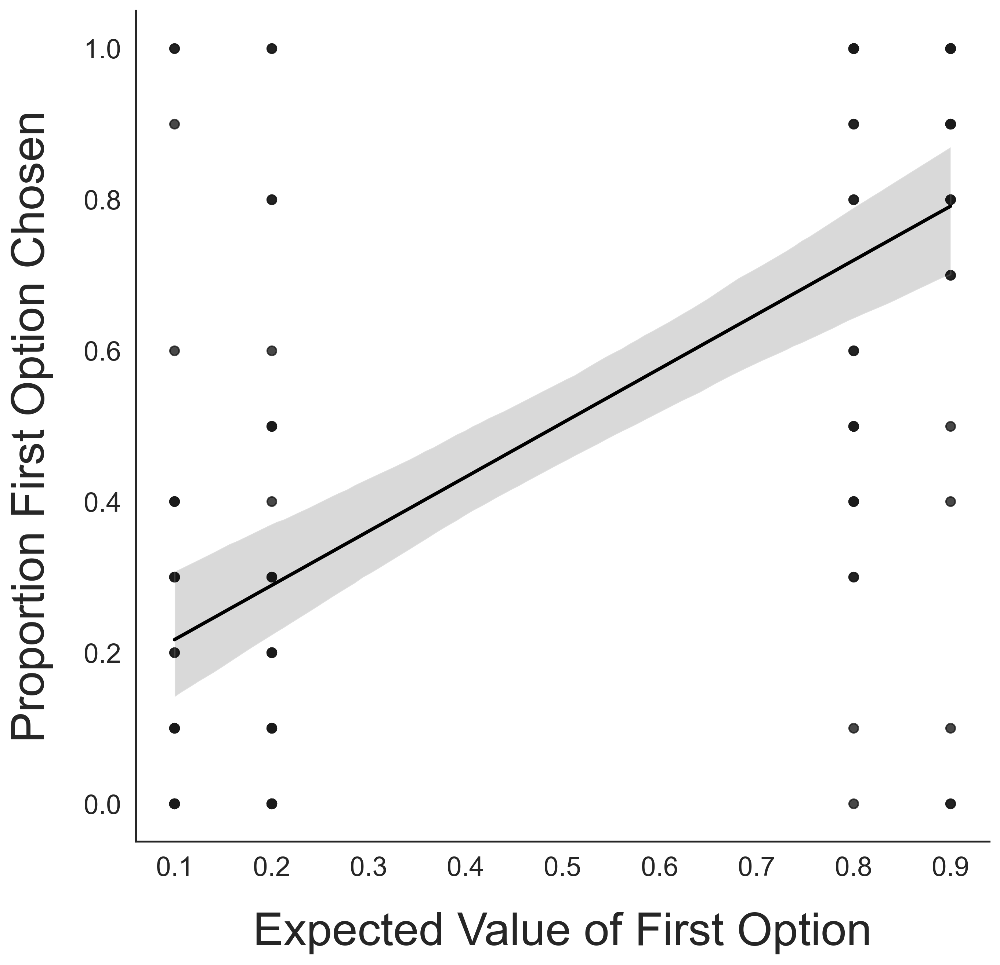

In [11]:
# Scatterplot
fig, ax = plt.subplots(figsize=(10, 10))
sns.regplot(x='variable', y='value', data=prob_match_df_long, 
            scatter_kws={"color": "k"}, line_kws={"color": "black"})
plt.ylabel("Proportion First Option Chosen", fontsize=30, labelpad=20)
plt.xlabel("Expected Value of First Option", fontsize=30, labelpad=20)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

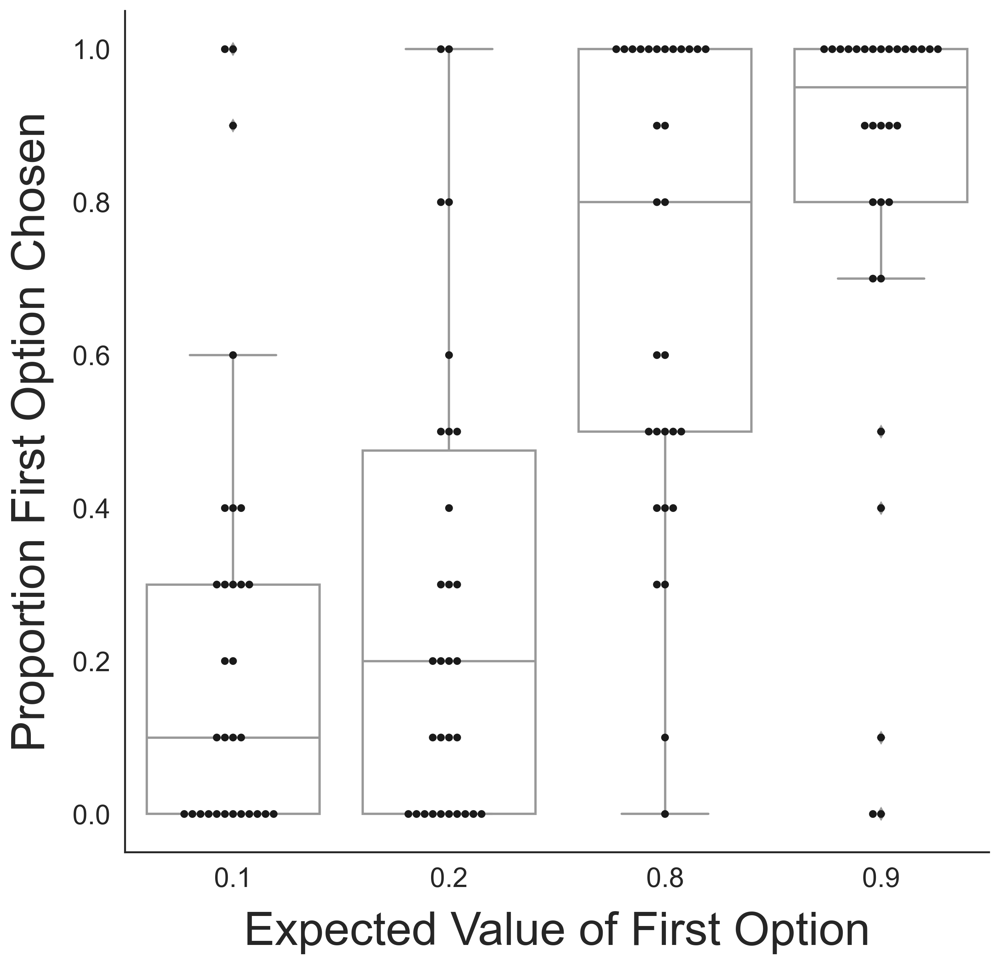

In [12]:
# Boxplot
fig, ax = plt.subplots(figsize=(10, 10))
sns.swarmplot(x='variable', y='value', data=prob_match_df_long, color='k')
sns.boxplot(x='variable', y='value', data=prob_match_df_long, color='w')
plt.ylabel("Proportion First Option Chosen", fontsize=30, labelpad=12)
plt.xlabel("Expected Value of First Option", fontsize=30, labelpad=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.rcParams["figure.dpi"] = 300
plt.show()

In [13]:
# Repeated measures ANOVA
model = AnovaRM(data=prob_match_df_long, depvar='value', subject='p_id', within=['variable'])
res = model.fit()
res.summary()

,F Value,Num DF,Den DF,Pr > F
variable,21.6534,3.0000,87.0000,0.0000


In [14]:
# Save the results
ttest_prob_match = pd.DataFrame()

# Paired t-tests
for col_1 in list(prob_match_df):
    for col_2 in list(prob_match_df):
        if col_1 == col_2:
            continue
        else:
            res = ttest(prob_match_df[col_1], 
                        prob_match_df[col_2], 
                        paired=True, 
                        alternative='two-sided')
            res['first_col'] = col_1
            res['second_col'] = col_2
            ttest_prob_match = pd.concat([ttest_prob_match, res])
            
ttest_prob_match = ttest_prob_match.reset_index(drop=True)
ttest_prob_match = ttest_prob_match[[ 'first_col', 'second_col', 'T', 'dof',
                                     'alternative', 'p-val', 'CI95%', 'cohen-d',
                                     'BF10', 'power']]
ttest_prob_match['p-val'] = round(ttest_prob_match['p-val'], 6)
ttest_prob_match

,first_col,second_col,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
0,one_ten_prop_10,one_five_prop_10,1.654212,29,two-sided,0.108870,"[-0.03, 0.25]",0.356338,0.655,0.470972
1,one_ten_prop_10,five_one_prop_50,5.846852,29,two-sided,0.000002,"[0.35, 0.72]",1.748224,7770.783,1.000000
2,one_ten_prop_10,ten_one_prop_100,5.716404,29,two-sided,0.000003,"[0.37, 0.78]",1.912417,5576.794,1.000000
3,one_five_prop_10,one_ten_prop_10,-1.654212,29,two-sided,0.108870,"[-0.25, 0.03]",0.356338,0.655,0.470972
4,one_five_prop_10,five_one_prop_50,3.913957,29,two-sided,0.000505,"[0.2, 0.65]",1.370838,60.705,1.000000
5,one_five_prop_10,ten_one_prop_100,5.635086,29,two-sided,0.000004,"[0.3, 0.64]",1.525648,4534.202,1.000000
6,five_one_prop_50,one_ten_prop_10,-5.846852,29,two-sided,0.000002,"[-0.72, -0.35]",1.748224,7770.783,1.000000
7,five_one_prop_50,one_five_prop_10,-3.913957,29,two-sided,0.000505,"[-0.65, -0.2]",1.370838,60.705,1.000000
8,five_one_prop_50,ten_one_prop_100,0.516794,29,two-sided,0.609219,"[-0.12, 0.2]",0.131515,0.22,0.107199
9,ten_one_prop_100,one_ten_prop_10,-5.716404,29,two-sided,0.000003,"[-0.78, -0.37]",1.912417,5576.794,1.000000


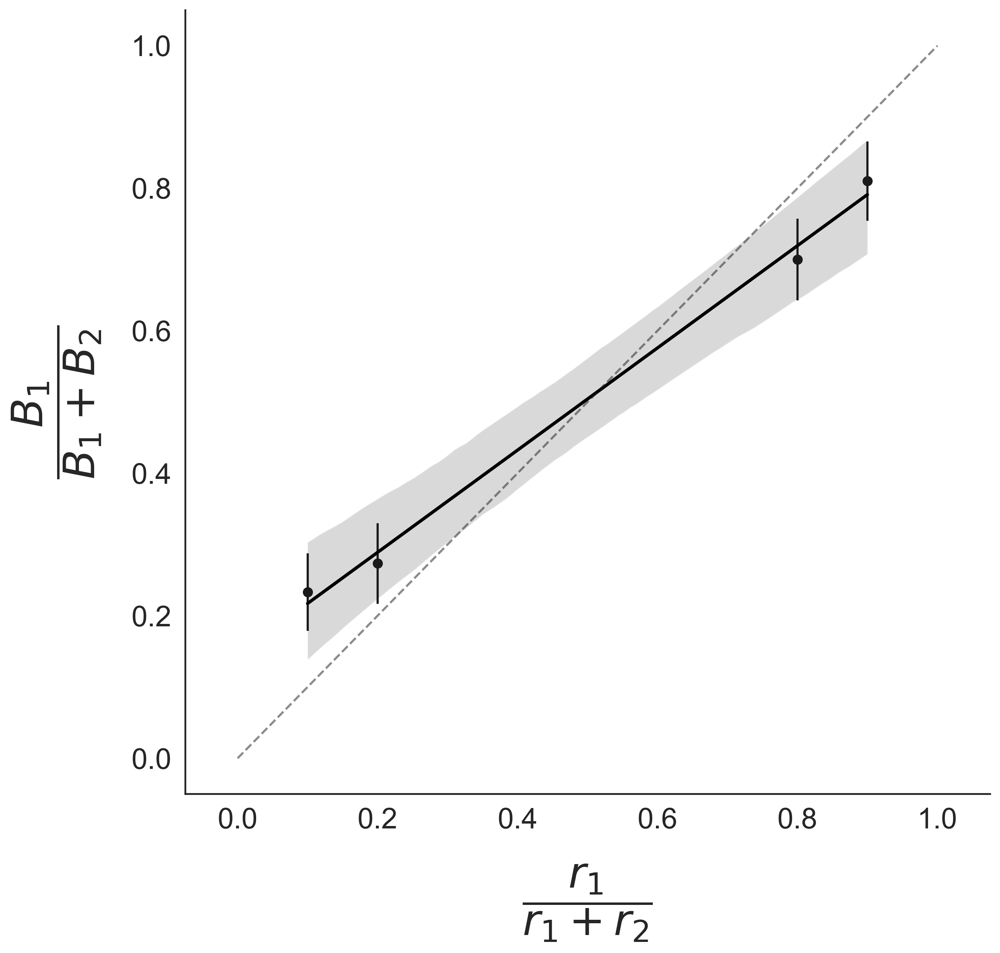

In [15]:
# Scatterplot of just average with errorbars
y_avg = prob_match_df_long.groupby(by=['variable']).mean().reset_index()['value']
err = prob_match_df_long.groupby(by=['variable']).sem().reset_index()['value']

fig, ax = plt.subplots(figsize=(10, 10))
sns.regplot(x='variable', y='value', data=prob_match_df_long, 
            scatter_kws={"color": "w"}, line_kws={"color": "black"})
plt.errorbar(x=[.1, .2, .8, .9], y=y_avg, yerr=err, fmt='o', color='k')
sns.lineplot(x=[0, 1], y=[0, 1], color='k', alpha=0.5, linestyle='dashed')
plt.ylabel(r"$\dfrac{B_{1}}{B_{1}+B_{2}}$", fontsize=30, labelpad=20)
ticks = [0.0, .2, .4, .6, .8, 1.0]
plt.yticks(ticks=ticks, labels=ticks, fontsize=20)
plt.xticks(ticks=ticks, labels=ticks, fontsize=20)
plt.xlim(-0.075, 1.075)
plt.xlabel(r'$\dfrac{r_{1}}{r_{1}+r_{2}}$', fontsize=30, labelpad=20)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.rcParams["figure.dpi"] = 300
plt.show()

### Individual Level

In [16]:
x = list(np.log([0.1, 0.2, 0.8, 0.9]).reshape(-1, 1))
scores = []
slopes = []
y_int = []

for i in range(len(prob_match_df)):
    y = list(prob_match_df.iloc[i])
    y = [val+0.1 for val in y]
    y = np.log(y)
    try:
        reg = LinearRegression().fit(x,y)
        scores.append(reg.score(x, y))
        slopes.append(np.abs(reg.coef_[0]))
        y_int.append(reg.intercept_)
    except:
        continue

fit_data = {'gme_r2':scores, 
            'gme_slopes':slopes, 
            'gme_y_int':y_int}

fit_data = pd.DataFrame(fit_data)
fit_data[::7]

,gme_r2,gme_slopes,gme_y_int
0,0.928515,1.242624,-2.420982
7,0.762375,0.657770,-1.304928
14,0.827343,0.851415,-1.928710
21,0.928515,1.242624,-2.420982
28,0.114643,0.130548,-0.593438


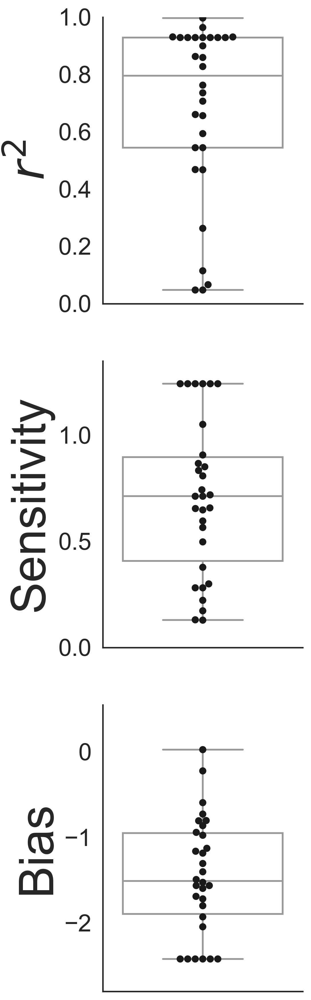

In [17]:
# Boxplot
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(3, 15))
# r2
sns.swarmplot(ax=ax[0], y=fit_data['gme_r2'], color='k', size=6)
sns.boxplot(ax=ax[0], y=fit_data['gme_r2'], color='w')
ax[0].set_ylim(0, 1)
ax[0].set_ylabel("$r^2$", fontsize=40)
ax[0].yaxis.set_tick_params(labelsize=20)
ax[0].spines.right.set_visible(False)
ax[0].spines.top.set_visible(False)

# Slopes
sns.swarmplot(ax=ax[1], y=fit_data['gme_slopes'], color='k', size=6)
sns.boxplot(ax=ax[1], y=fit_data['gme_slopes'], color='w')
ax[1].set_ylim(0, 1.35)
ax[1].set_ylabel("Sensitivity", fontsize=40)
ax[1].yaxis.set_tick_params(labelsize=20)
ax[1].spines.right.set_visible(False)
ax[1].spines.top.set_visible(False)

# Y-int
sns.swarmplot(ax=ax[2], y=fit_data['gme_y_int'], color='k', size=6)
sns.boxplot(ax=ax[2], y=fit_data['gme_y_int'], color='w')
ax[2].set_ylim(-2.8, 0.55)
ax[2].set_ylabel("Bias", fontsize=40)
ax[2].yaxis.set_tick_params(labelsize=20)
ax[2].spines.right.set_visible(False)
ax[2].spines.top.set_visible(False)
plt.rcParams["figure.dpi"] = 300
plt.show()

In [18]:
# What is the proportion where VAC is greater than 0.60?
len(fit_data[fit_data['gme_r2']>=.6])/len(fit_data)

0.6666666666666666

In [19]:
# Append to df
df = pd.concat([df, fit_data], axis=1)
df[::9]

,race,education,income,one_ten_prop_10,five_one_prop_50,one_five_prop_10,ten_one_prop_100,loss_money_h,gain_money_h,loss_ethics_h,gain_ethics_h,utilitarian_rank,deontology_rank,virtue_rank,ethics_care_rank,contract_theory_rank,gme_r2,gme_slopes,gme_y_int
0,White or Caucasian,Bachelor's degree,"$100,000-$149,999",1.0,0.0,1.0,0.0,2.51,7.05,2.13,7.05,1,5,2,4,3,0.928515,1.242624,-2.420982
9,Asian,High school diploma or GED,Prefer not to say,1.0,0.5,0.3,0.0,4.29,0.82,3.45,9.65,2,1,3,5,4,0.467180,0.648170,-1.595744
18,White or Caucasian,Bachelor's degree,"Less than $25,000",1.0,1.0,0.0,0.0,0.94,9.65,16.61,1.22,1,4,5,2,3,0.047548,0.281199,-1.401745
27,White or Caucasian,High school diploma or GED,"$50,000-$74,999",1.0,0.0,1.0,0.0,3.45,9.65,3.45,0.18,3,1,2,5,4,0.928515,1.242624,-2.420982


## Probability Discounting Tasks

In [20]:
disc_df = df[['loss_money_h', 'gain_money_h', 'loss_ethics_h', 'gain_ethics_h',]]
disc_df.columns = ['Lose Money', 'Gain Money', 'Violate Ethics', 'Comply Ethics']
disc_df = np.log(disc_df)
disc_df.sample(5)

,Lose Money,Gain Money,Violate Ethics,Comply Ethics
29,0.198851,0.470004,-1.469676,0.756122
5,1.238374,0.058269,-3.912023,2.810005
2,0.198851,0.756122,0.058269,-0.462035
19,0.598837,1.456287,-0.061875,0.198851
14,0.756122,0.598837,0.756122,0.198851


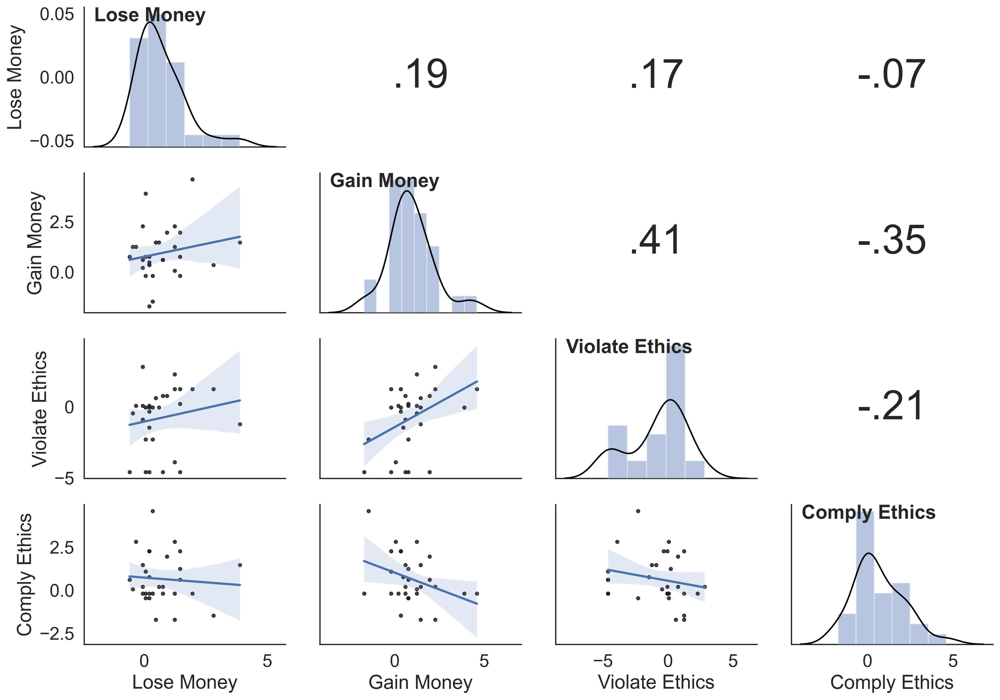

In [21]:
# Correlation matrix
corr_plot(disc_df)

In [22]:
# PREP FOR EASIER PLOTTING
disc_df_long = disc_df.copy()
disc_df_long['p_id'] = list(range(1, len(disc_df_long)+1))

# Turn from wide to long
disc_df_long = disc_df_long.melt(id_vars=['p_id'])

In [23]:
# Repeated measures ANOVA
model = AnovaRM(data=disc_df_long, depvar='value', subject='p_id', within=['variable'])
res = model.fit()
res.summary()

,F Value,Num DF,Den DF,Pr > F
variable,7.9245,3.0000,87.0000,0.0001


In [24]:
# Save the results
ttest_disc_df = pd.DataFrame()

# Paired t-tests
for col_1 in list(disc_df):
    for col_2 in list(disc_df):
        if col_1 == col_2:
            continue
        else:
            res = ttest(disc_df[col_1], 
                        disc_df[col_2], 
                        paired=True, 
                        alternative='two-sided')
            res['first_col'] = col_1
            res['second_col'] = col_2
            ttest_disc_df = pd.concat([ttest_disc_df, res])
            
ttest_disc_df = ttest_disc_df.reset_index(drop=True)
ttest_disc_df = ttest_disc_df[[ 'first_col', 'second_col', 'T', 'dof',
                                     'alternative', 'p-val', 'CI95%', 'cohen-d',
                                     'BF10', 'power']]
ttest_disc_df

,first_col,second_col,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
0,Lose Money,Gain Money,-0.912361,29,two-sided,0.369101,"[-0.79, 0.3]",0.212714,0.285,0.203373
1,Lose Money,Violate Ethics,3.606569,29,two-sided,0.001151,"[0.64, 2.31]",0.870246,29.275,0.995899
2,Lose Money,Comply Ethics,0.091970,29,two-sided,0.927354,"[-0.64, 0.7]",0.024552,0.195,0.051941
3,Gain Money,Lose Money,0.912361,29,two-sided,0.369101,"[-0.3, 0.79]",0.212714,0.285,0.203373
4,Gain Money,Violate Ethics,4.629200,29,two-sided,0.000071,"[0.96, 2.48]",0.955345,353.708,0.999009
5,Gain Money,Comply Ethics,0.665850,29,two-sided,0.510769,"[-0.57, 1.11]",0.199690,0.238,0.184754
6,Violate Ethics,Lose Money,-3.606569,29,two-sided,0.001151,"[-2.31, -0.64]",0.870246,29.275,0.995899
7,Violate Ethics,Gain Money,-4.629200,29,two-sided,0.000071,"[-2.48, -0.96]",0.955345,353.708,0.999009
8,Violate Ethics,Comply Ethics,-2.761855,29,two-sided,0.009869,"[-2.51, -0.37]",0.778646,4.554,0.984607
9,Comply Ethics,Lose Money,-0.091970,29,two-sided,0.927354,"[-0.7, 0.64]",0.024552,0.195,0.051941


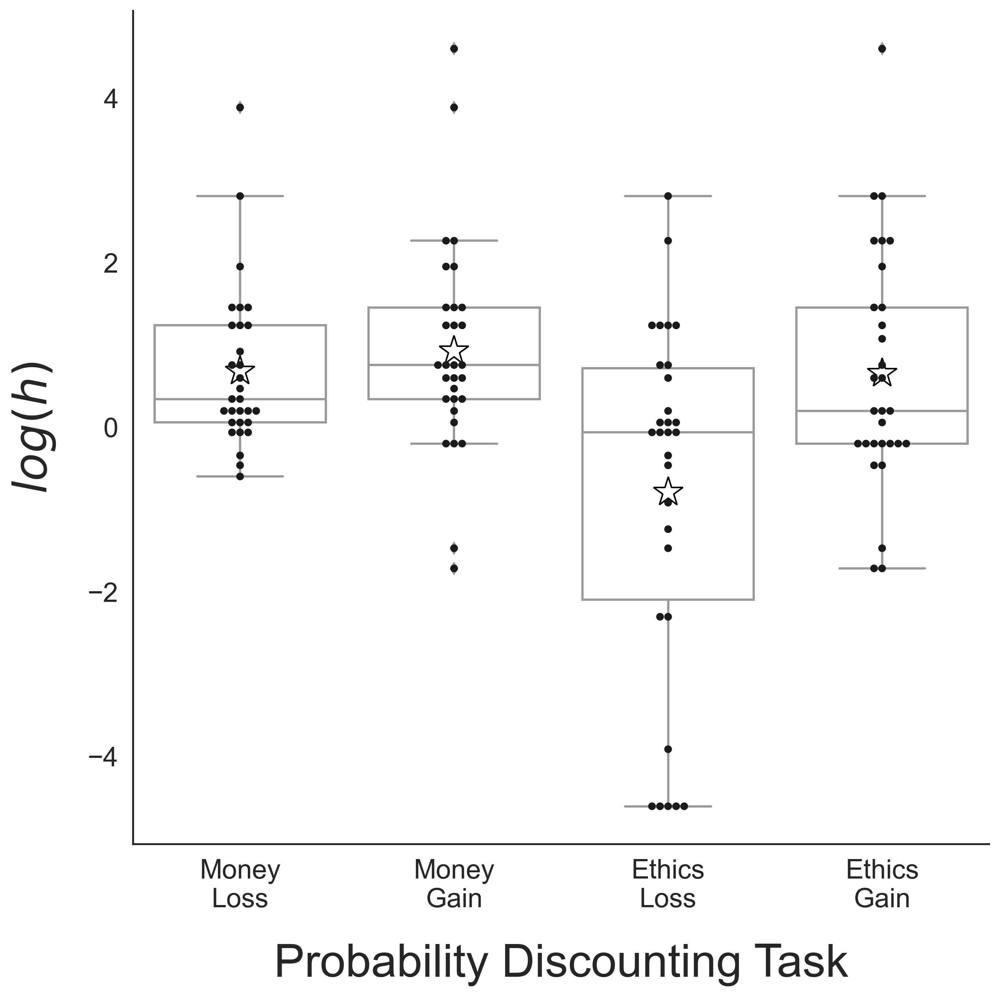

In [25]:
# Boxplot
fig, ax = plt.subplots(figsize=(10, 10))
sns.swarmplot(x='variable', y='value', data=disc_df_long, color='k')
sns.boxplot(x='variable', y='value', data=disc_df_long, color='w', 
            showmeans=True, meanprops={"marker":"*",
                                       "markerfacecolor":"w", 
                                       "markeredgecolor":"black",
                                       "markersize":"20"})
plt.ylabel("$\itlog({h})$", fontsize=30, labelpad=20)
ticks = [0, 1, 2, 3]
labels=['Money\nLoss', 'Money\nGain', 'Ethics\nLoss', 'Ethics\nGain']
plt.xticks(ticks=ticks, labels=labels)
plt.xlabel("Probability Discounting Task", fontsize=30, labelpad=20)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.rcParams["figure.dpi"] = 300
plt.show()

#### Ethics Theory Ranking

In [26]:
theor_df = df[['utilitarian_rank', 'deontology_rank', 'virtue_rank', 'ethics_care_rank', 'contract_theory_rank']]
theor_df[::8]

,utilitarian_rank,deontology_rank,virtue_rank,ethics_care_rank,contract_theory_rank
0,1,5,2,4,3
8,3,1,2,4,5
16,5,4,1,3,2
24,2,3,1,4,5


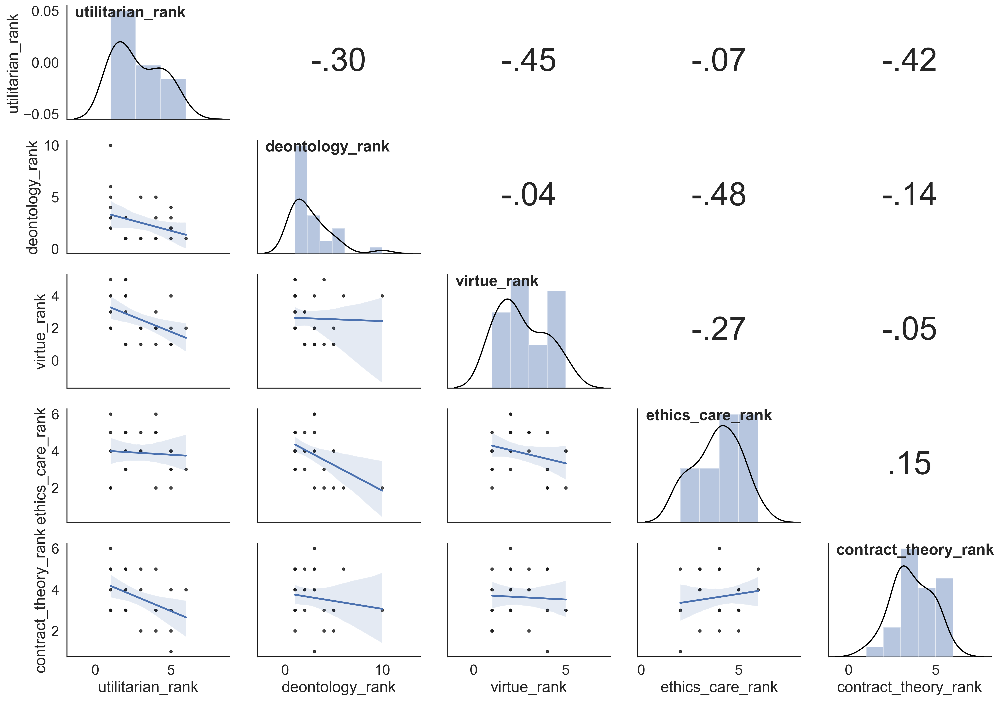

In [27]:
# Correlation matrix
corr_plot(theor_df)

In [28]:
# PREP FOR EASIER PLOTTING
theor_df_long = theor_df.copy()
theor_df_long['p_id'] = list(range(1, len(theor_df)+1))

# Turn from wide to long
theor_df_long = theor_df_long.melt(id_vars=['p_id'])
theor_df_long[::34]

,p_id,variable,value
0,1,utilitarian_rank,1
34,5,deontology_rank,2
68,9,virtue_rank,2
102,13,ethics_care_rank,4
136,17,contract_theory_rank,2


In [29]:
# Repeated measures ANOVA
theor_df_long = theor_df_long.dropna().reset_index(drop=True)
model = AnovaRM(data=theor_df_long, depvar='value', subject='p_id', within=['variable'])
res = model.fit()
res.summary()

,F Value,Num DF,Den DF,Pr > F
variable,4.1666,4.0000,116.0000,0.0034


In [30]:
# Save the results
ttest_theor_df = pd.DataFrame()

# Paired t-tests
for col_1 in list(theor_df):
    for col_2 in list(theor_df):
        if col_1 == col_2:
            continue
        else:
            res = ttest(theor_df[col_1], 
                        theor_df[col_2], 
                        paired=True, 
                        alternative='two-sided')
            res['first_col'] = col_1
            res['second_col'] = col_2
            ttest_theor_df = pd.concat([ttest_theor_df, res])
            
ttest_theor_df = ttest_theor_df.reset_index(drop=True)
ttest_theor_df = ttest_theor_df[[ 'first_col', 'second_col', 'T', 'dof',
                                     'alternative', 'p-val', 'CI95%', 'cohen-d',
                                     'BF10', 'power']]
ttest_theor_df

,first_col,second_col,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
0,utilitarian_rank,deontology_rank,0.371023,29,two-sided,0.713317,"[-0.9, 1.3]",0.108797,0.207,0.088846
1,utilitarian_rank,virtue_rank,0.441170,29,two-sided,0.662362,"[-0.73, 1.13]",0.136783,0.213,0.111985
2,utilitarian_rank,ethics_care_rank,-2.953240,29,two-sided,0.006178,"[-1.86, -0.34]",0.786337,6.787,0.986112
3,utilitarian_rank,contract_theory_rank,-1.966909,29,two-sided,0.058827,"[-1.7, 0.03]",0.600311,1.052,0.888275
4,deontology_rank,utilitarian_rank,-0.371023,29,two-sided,0.713317,"[-1.3, 0.9]",0.108797,0.207,0.088846
5,deontology_rank,virtue_rank,0.000000,29,two-sided,1.000000,"[-0.93, 0.93]",0.000000,0.194,0.050000
6,deontology_rank,ethics_care_rank,-2.515813,29,two-sided,0.017667,"[-2.36, -0.24]",0.773335,2.793,0.983487
7,deontology_rank,contract_theory_rank,-2.265691,29,two-sided,0.031113,"[-1.97, -0.1]",0.617979,1.753,0.905038
8,virtue_rank,utilitarian_rank,-0.441170,29,two-sided,0.662362,"[-1.13, 0.73]",0.136783,0.213,0.111985
9,virtue_rank,deontology_rank,0.000000,29,two-sided,1.000000,"[-0.93, 0.93]",0.000000,0.194,0.050000


In [31]:
theor_df_long

,p_id,variable,value
0,1,utilitarian_rank,1
1,2,utilitarian_rank,1
2,3,utilitarian_rank,1
3,4,utilitarian_rank,2
4,5,utilitarian_rank,1
...,...,...,...
145,26,contract_theory_rank,4
146,27,contract_theory_rank,3
147,28,contract_theory_rank,4
148,29,contract_theory_rank,4


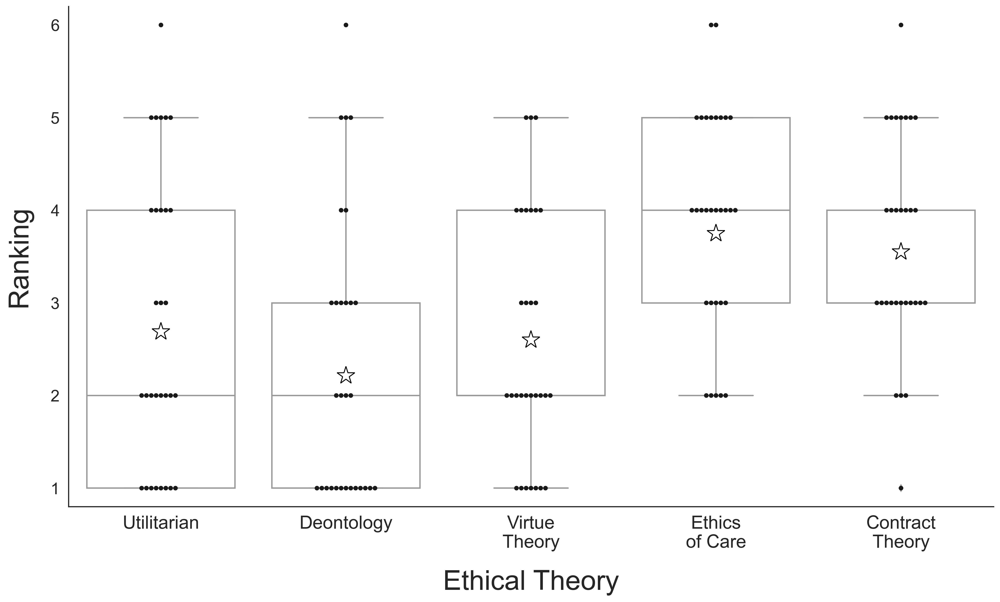

In [32]:
# Boxplot
fig, ax = plt.subplots(figsize=(18, 10))
sns.swarmplot(x='variable', y='value', data=theor_df_long, color='k')
sns.boxplot(x='variable', y='value', data=theor_df_long[theor_df_long['value']<6], color='w', 
           showmeans=True, meanprops={"marker":"*",
                                      "markerfacecolor":"white", 
                                      "markeredgecolor":"black",
                                      "markersize":"20"})
plt.ylabel("Ranking", fontsize=30, labelpad=20)
ticks = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
plt.yticks(ticks=ticks, labels=ticks)
plt.ylim(0.8, 6.2)
ticks = [0, 1, 2, 3, 4]
labels=["Utilitarian", 'Deontology', 'Virtue\nTheory', 'Ethics\nof Care', 'Contract\nTheory']
plt.xticks(ticks=ticks, labels=labels, fontsize=20)
plt.xlabel("Ethical Theory", fontsize=30, labelpad=20)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.rcParams["figure.dpi"] = 300
plt.show()

In [33]:
theor_df.describe()

,utilitarian_rank,deontology_rank,virtue_rank,ethics_care_rank,contract_theory_rank
count,30.000000,30.000000,30.000000,30.000000,30.000000
mean,2.800000,2.600000,2.600000,3.900000,3.633333
std,1.584407,2.061135,1.328728,1.184672,1.159171
min,1.000000,1.000000,1.000000,2.000000,1.000000
25%,1.250000,1.000000,2.000000,3.000000,3.000000
50%,2.000000,2.000000,2.000000,4.000000,3.500000
75%,4.000000,3.000000,4.000000,5.000000,4.750000
max,6.000000,10.000000,5.000000,6.000000,6.000000


# Relationships between different decision-making tasks

In [34]:
# Convert raw rankings to binary category
df['util_rank_cat'] = theory_cat(df=df, col='utilitarian_rank')
df['deont_rank_cat'] = theory_cat(df=df, col='deontology_rank')
df['virtue_rank_cat'] = theory_cat(df=df, col='virtue_rank')
df['care_rank_cat'] = theory_cat(df=df, col='ethics_care_rank')
df['contract_rank_cat'] = theory_cat(df=df, col='contract_theory_rank')

In [35]:
# Arrange for easy plotting
plot_df = df.drop(['race', 'education', 'income', 'utilitarian_rank', 'deontology_rank', 
                   'virtue_rank', 'ethics_care_rank', 'contract_theory_rank', 
                   'one_ten_prop_10', 'one_five_prop_10',
                   'five_one_prop_50', 'ten_one_prop_100'], axis=1)

# Drop those for whom the GME firt was below 0.60
plot_df = plot_df[plot_df['gme_r2']>=0.60].reset_index(drop=True)

plot_df = plot_df.melt(id_vars=['util_rank_cat', 'deont_rank_cat', 
                                'virtue_rank_cat', 'care_rank_cat', 
                                'contract_rank_cat']).reset_index(drop=True)
plot_df

,util_rank_cat,deont_rank_cat,virtue_rank_cat,care_rank_cat,contract_rank_cat,variable,value
0,utilitarian_rank_high,deontology_rank_low,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,loss_money_h,2.510000
1,utilitarian_rank_high,deontology_rank_low,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,loss_money_h,0.940000
2,utilitarian_rank_high,deontology_rank_low,virtue_rank_low,ethics_care_rank_high,contract_theory_rank_low,loss_money_h,1.220000
3,utilitarian_rank_high,deontology_rank_high,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_low,loss_money_h,1.600000
4,utilitarian_rank_low,deontology_rank_high,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_high,loss_money_h,3.450000
...,...,...,...,...,...,...,...
135,utilitarian_rank_low,deontology_rank_high,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,gme_y_int,-1.492078
136,utilitarian_rank_high,deontology_rank_high,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_low,gme_y_int,-1.525155
137,utilitarian_rank_low,deontology_rank_high,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,gme_y_int,-2.420982
138,utilitarian_rank_low,deontology_rank_high,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,gme_y_int,-2.420982


In [36]:
plot_df.variable.unique()

array(['loss_money_h', 'gain_money_h', 'loss_ethics_h', 'gain_ethics_h',
       'gme_r2', 'gme_slopes', 'gme_y_int'], dtype=object)

### Differences in matching 

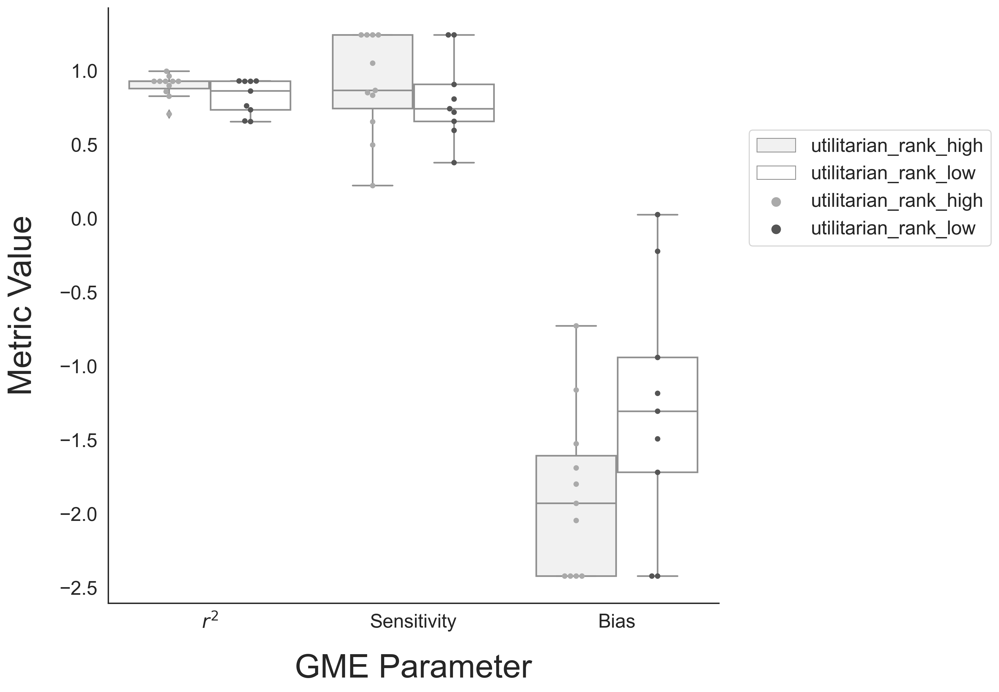

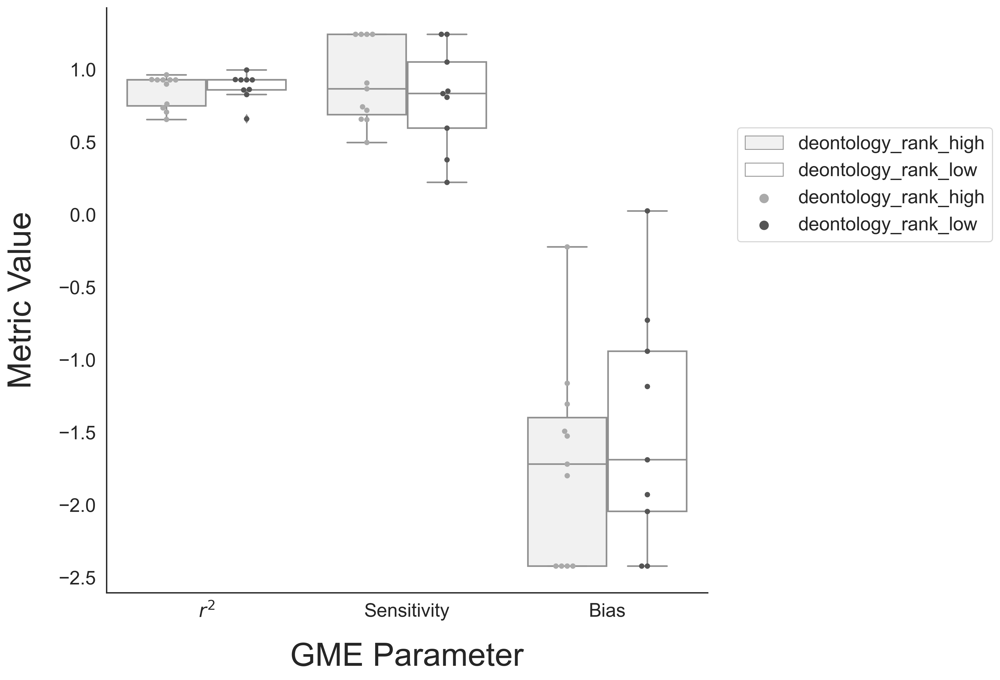

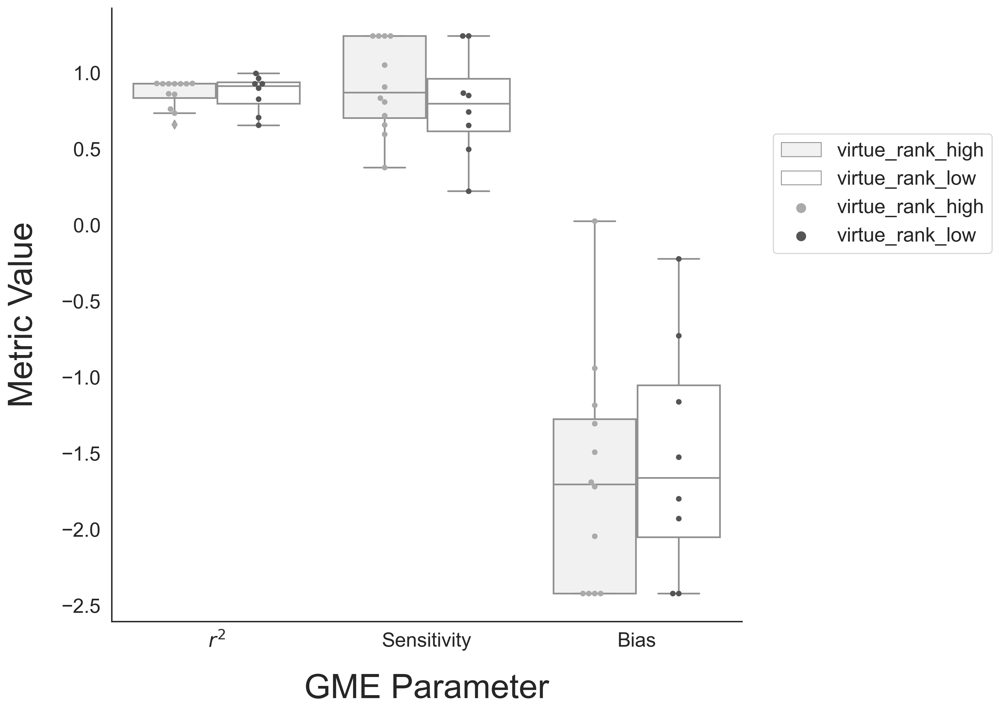

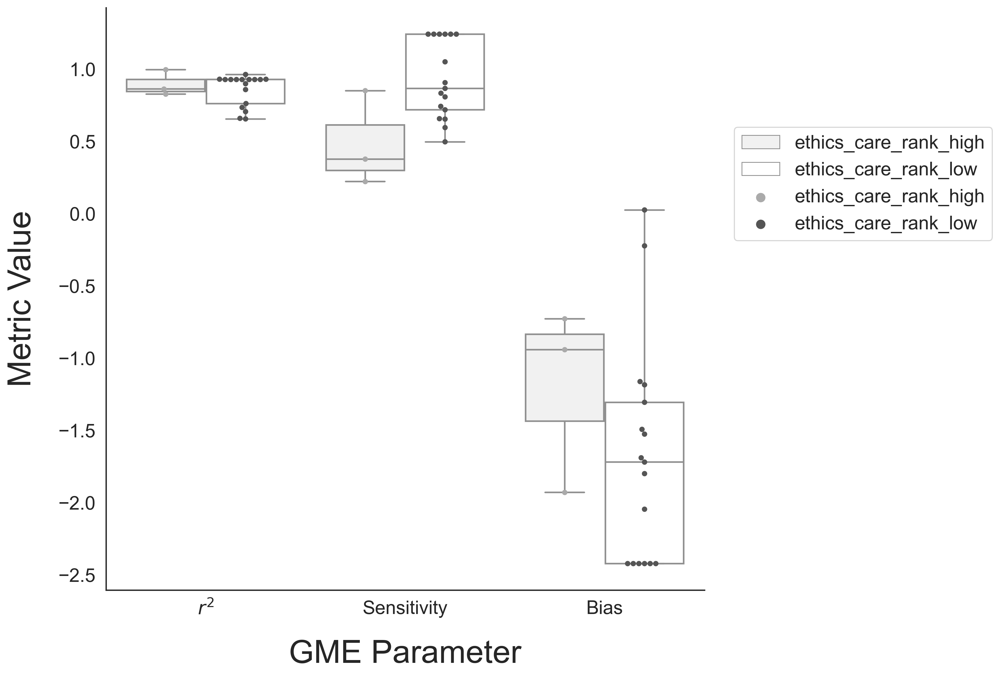

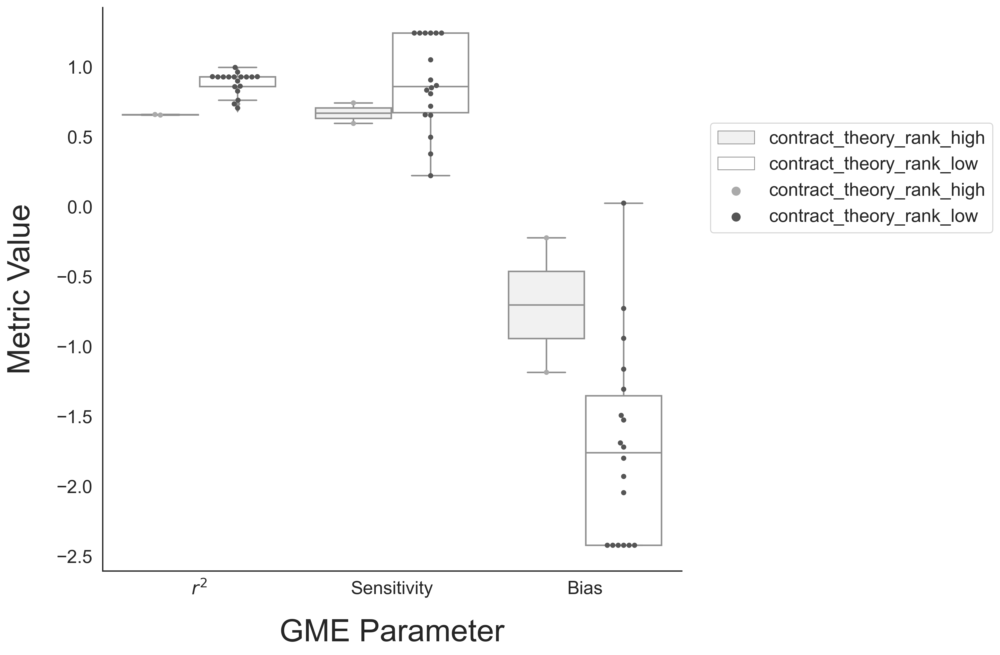

In [37]:
plot_df_prop = plot_df[plot_df['variable'].isin(['gme_r2', 'gme_slopes','gme_y_int'])]

# Boxplots
theories = ['util_rank_cat', 'deont_rank_cat', 'virtue_rank_cat', 'care_rank_cat', 'contract_rank_cat']

for theor in theories:
    plot_df_prop = plot_df_prop.sort_values(by=['variable', theor])
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.swarmplot(x='variable', y='value', hue=theor, dodge=True, data=plot_df_prop, 
                  palette='binary', order=['gme_r2', 'gme_slopes','gme_y_int'])
    sns.boxplot(x='variable', y='value', hue=theor, data=plot_df_prop, color='w')
    plt.ylabel("Metric Value", fontsize=30, labelpad=20)
    ticks = [0, 1, 2]
    labels=['$r^{2}$', 'Sensitivity', 'Bias']
    plt.xticks(ticks=ticks, labels=labels)
    plt.xlabel("GME Parameter", fontsize=30, labelpad=20)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.legend(loc=(1.05,0.6))
    plt.rcParams["figure.dpi"] = 300
    plt.show()

In [38]:
plot_df_prop

,util_rank_cat,deont_rank_cat,virtue_rank_cat,care_rank_cat,contract_rank_cat,variable,value
92,utilitarian_rank_low,deontology_rank_low,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_high,gme_r2,0.660006
84,utilitarian_rank_low,deontology_rank_high,virtue_rank_low,ethics_care_rank_low,contract_theory_rank_high,gme_r2,0.655983
94,utilitarian_rank_low,deontology_rank_low,virtue_rank_high,ethics_care_rank_high,contract_theory_rank_low,gme_r2,0.862532
82,utilitarian_rank_high,deontology_rank_low,virtue_rank_low,ethics_care_rank_high,contract_theory_rank_low,gme_r2,0.996628
89,utilitarian_rank_high,deontology_rank_low,virtue_rank_low,ethics_care_rank_high,contract_theory_rank_low,gme_r2,0.827343
85,utilitarian_rank_low,deontology_rank_high,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,gme_r2,0.762375
95,utilitarian_rank_low,deontology_rank_high,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,gme_r2,0.930769
97,utilitarian_rank_low,deontology_rank_high,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,gme_r2,0.928515
98,utilitarian_rank_low,deontology_rank_high,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,gme_r2,0.928515
99,utilitarian_rank_low,deontology_rank_high,virtue_rank_high,ethics_care_rank_low,contract_theory_rank_low,gme_r2,0.735594


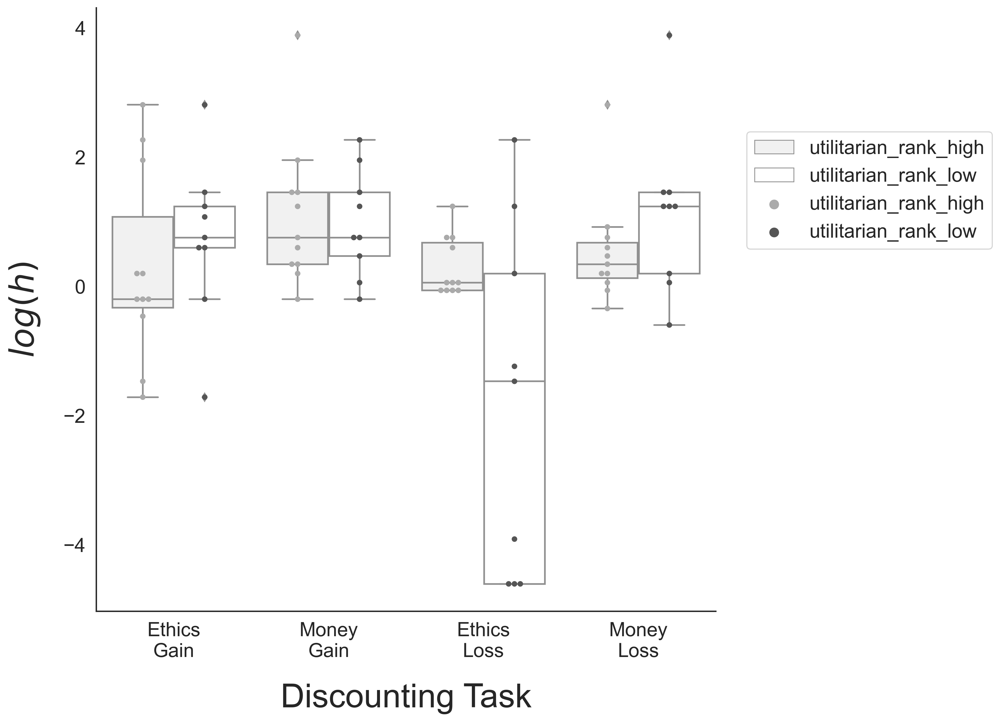

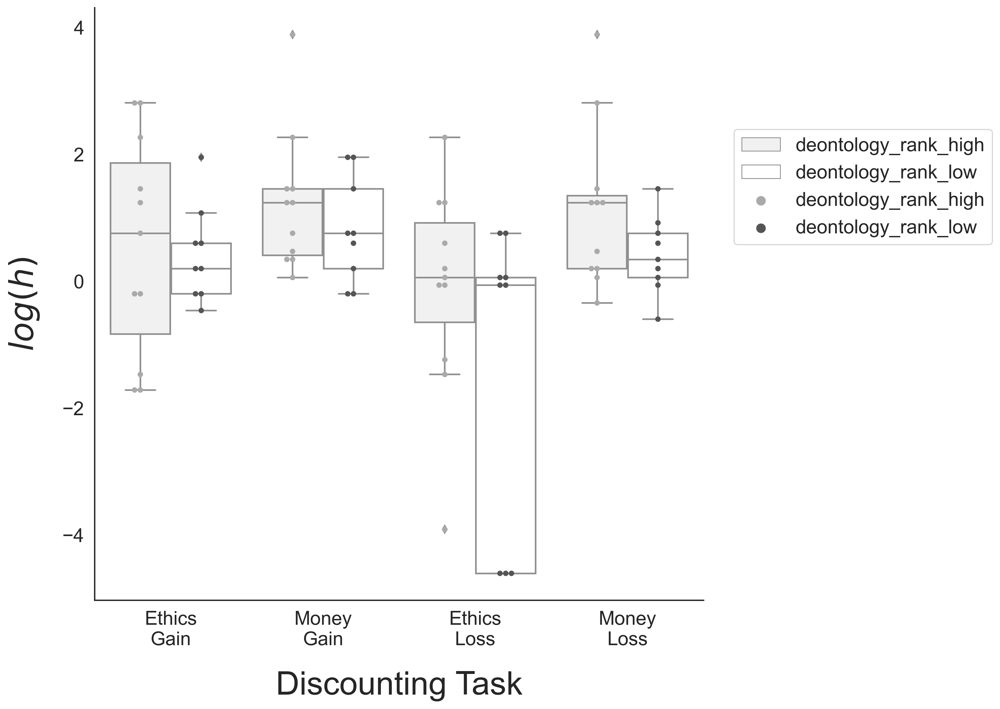

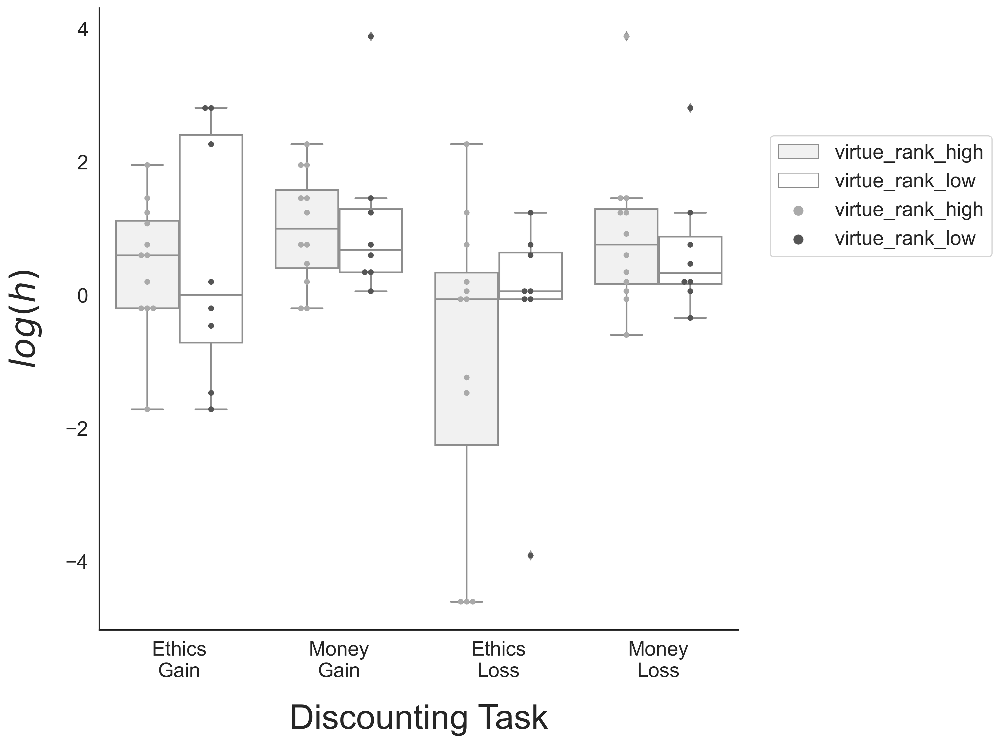

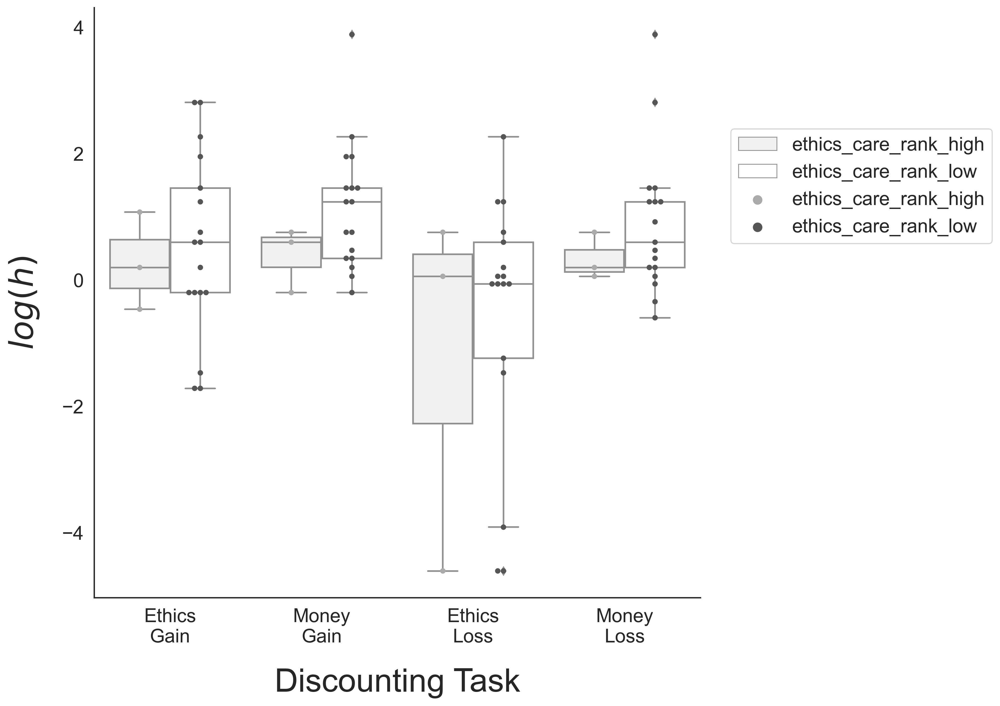

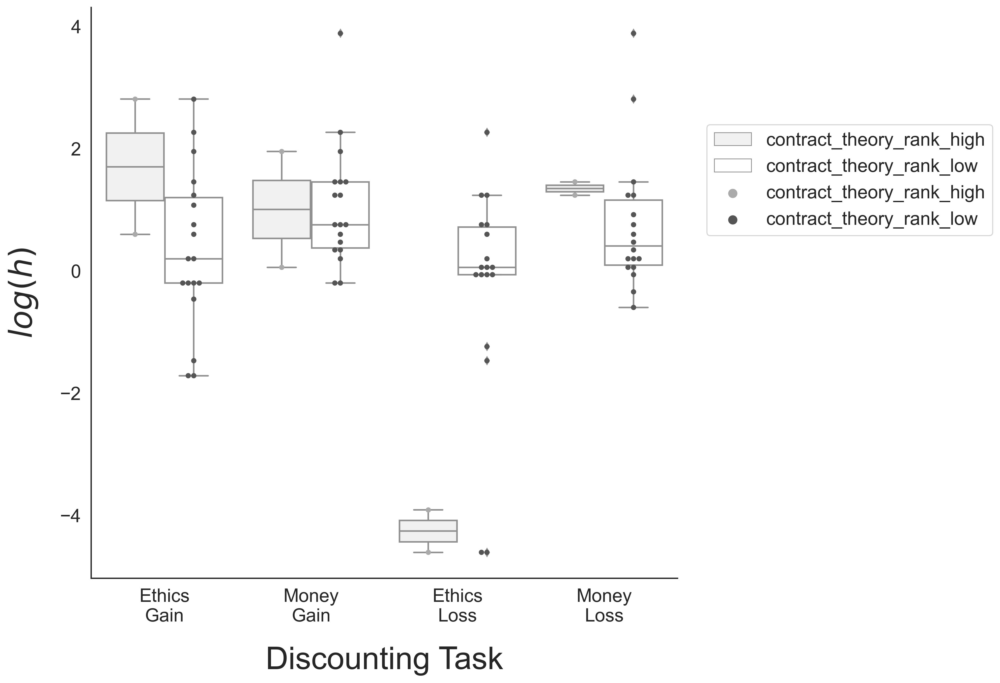

In [39]:
plot_df_prop = plot_df[plot_df['variable'].isin(['loss_money_h', 'gain_money_h', 
                                                 'loss_ethics_h', 'gain_ethics_h'])]
plot_df_prop['value'] = np.log(plot_df_prop['value'])

# Boxplots
theories = ['util_rank_cat', 'deont_rank_cat', 'virtue_rank_cat', 'care_rank_cat', 'contract_rank_cat']

for theor in theories:
    plot_df_prop = plot_df_prop.sort_values(by=['variable', theor])
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.swarmplot(x='variable', y='value', hue=theor, dodge=True, data=plot_df_prop, palette='binary')
    sns.boxplot(x='variable', y='value', hue=theor, data=plot_df_prop, color='w')
    plt.ylabel("$\itlog({h})$", fontsize=30, labelpad=20)
    ticks = [0, 1, 2, 3]
    labels=['Ethics\nGain', 'Money\nGain', 'Ethics\nLoss', 'Money\nLoss']
    plt.xticks(ticks=ticks, labels=labels)
    plt.xlabel("Discounting Task", fontsize=30, labelpad=20)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    plt.legend(loc=(1.05,0.6))
    plt.rcParams["figure.dpi"] = 300
    plt.show()

In [40]:
quant_df = df[['loss_money_h', 'gain_money_h', 'loss_ethics_h', 'gain_ethics_h']]
quant_df = np.log(quant_df)
gme_df = df[['gme_r2', 'gme_slopes', 'gme_y_int']]
quant_df = pd.concat([gme_df, quant_df], axis=1)
quant_df = quant_df[quant_df['gme_r2']>=.8].reset_index(drop=True)
quant_df.columns = ['Prob Match\n$r^2$', 'Prob Match\nSensitivity', 'Prob Match\nBias', 
                    'Lose Money', 'Gain Money', 'Violate Ethics', 'Comply Ethics']
quant_df[::9]

,Prob Match\n$r^2$,Prob Match\nSensitivity,Prob Match\nBias,Lose Money,Gain Money,Violate Ethics,Comply Ethics
0,0.928515,1.242624,-2.420982,0.920283,1.953028,0.756122,1.953028
9,0.928515,1.242624,-2.420982,0.343590,-0.198451,-0.061875,-0.198451


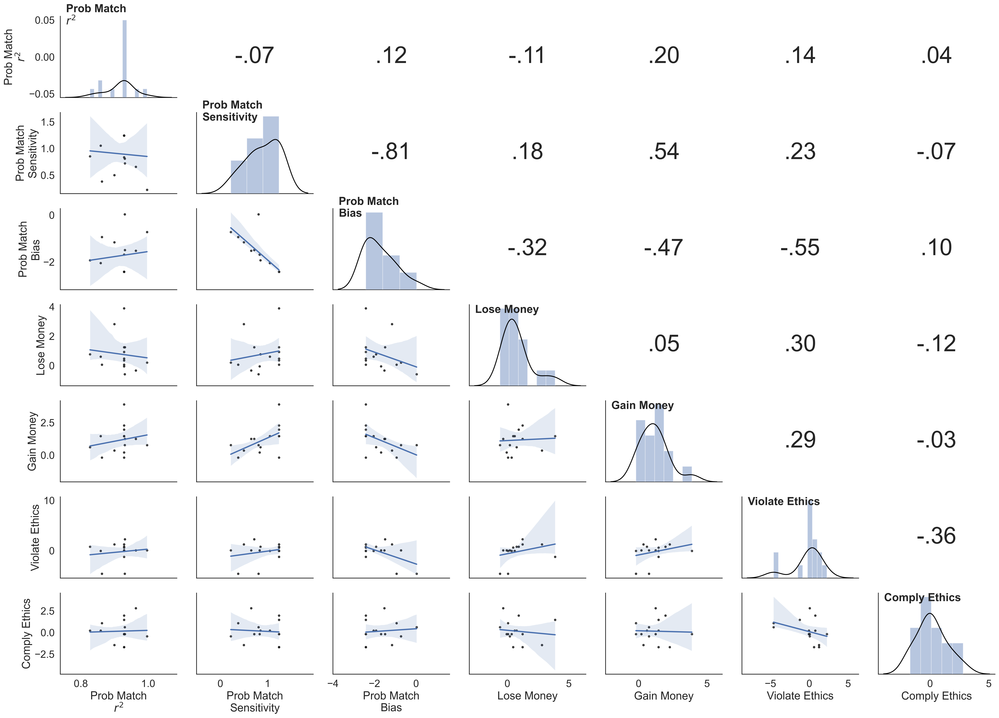

In [41]:
corr_plot(quant_df)

In [42]:
theor_df = df[['loss_ethics_h', 'gain_ethics_h']]
theor_df = np.log(theor_df)
rank_df = df[['utilitarian_rank', 'deontology_rank', 'virtue_rank', 
              'ethics_care_rank', 'contract_theory_rank']]
theor_df = pd.concat([rank_df, theor_df], axis=1)
theor_df.columns = ['Utilitarianism', 'Deontology', 'Virtue Theory', 
                    'Ethics of Care', 'Contract Theory', 
                    'Violate Ethics', 'Comply Ethics']
theor_df = theor_df.dropna().reset_index(drop=True)
theor_df[::9]

,Utilitarianism,Deontology,Virtue Theory,Ethics of Care,Contract Theory,Violate Ethics,Comply Ethics
0,1,5,2,4,3,0.756122,1.953028
9,2,1,3,5,4,1.238374,2.266958
18,1,4,5,2,3,2.810005,0.198851
27,3,1,2,5,4,1.238374,-1.714798


In [43]:
theor_df.describe()

,Utilitarianism,Deontology,Virtue Theory,Ethics of Care,Contract Theory,Violate Ethics,Comply Ethics
count,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000
mean,2.800000,2.600000,2.600000,3.900000,3.633333,-0.790124,0.653205
std,1.584407,2.061135,1.328728,1.184672,1.159171,2.187867,1.444017
min,1.000000,1.000000,1.000000,2.000000,1.000000,-4.605170,-1.714798
25%,1.250000,1.000000,2.000000,3.000000,3.000000,-2.094358,-0.198451
50%,2.000000,2.000000,2.000000,4.000000,3.500000,-0.061875,0.198851
75%,4.000000,3.000000,4.000000,5.000000,4.750000,0.716801,1.456287
max,6.000000,10.000000,5.000000,6.000000,6.000000,2.810005,4.600158


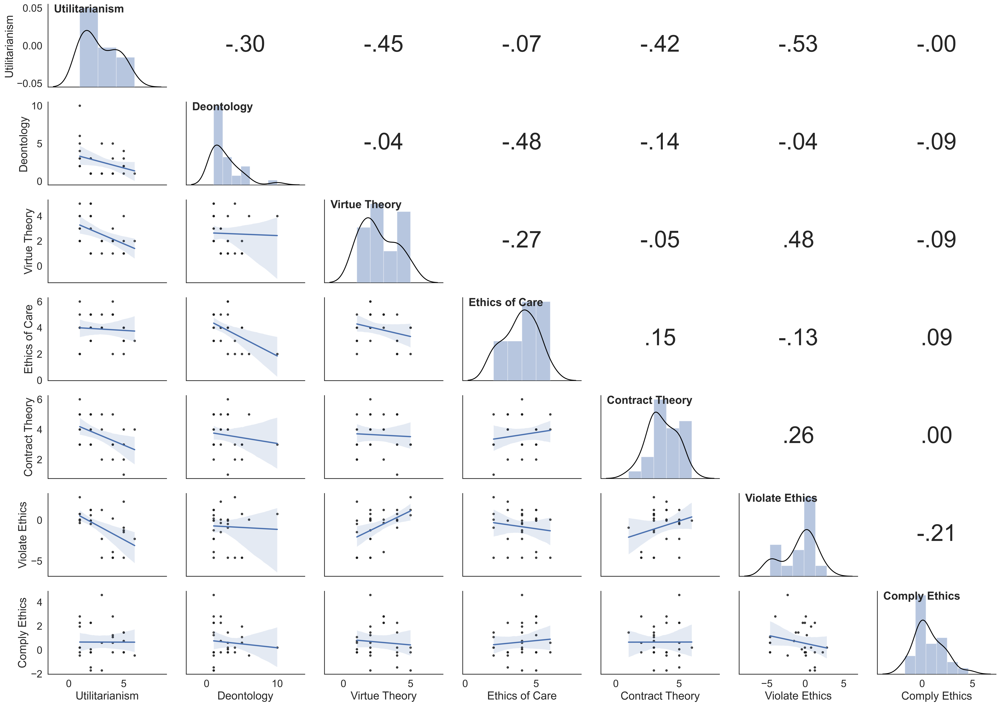

In [44]:
corr_plot(theor_df)